### Laboratorium 6 - część projektowa

W tej części zajmiesz się wykorzystaniem punktów kluczowych do łączenia obrazów (_image stitching_). Celem zadania jest przetestowanie możliwości detekcji i parowania punktów kluczowych w celu łączenia obrazów. Istotne jest, by samodzielnie przejść całą ścieżkę: od detekcji punktów kluczowych i wyznaczenia ich desktryptorów, przez ich parowanie i znalezienie transformacji, po finalne połączenie obrazów. Rozwiązania oparte o gotowce w stylu black-box nie będą oceniane.

Wykonaj serię zdjęć dowolnej wybranej przez siebie **statycznej** sceny. Może to być niemal dowolny widok o dowolnej skali: panorama miasta, swojego pokoju, powierzchni biurka - ważne, by pozyskane obrazy umożliwiały (1) użycie algorytmu SIFT, oraz (2) wykonanie transformacji geometrycznej.

Wykonaj 4-5 zdjęć, spośród których pierwsze (nazwij je `base`) niech przedstawia \"główny\" widok sceny, a pozostałe (o nazwie `offset_{index}`) niech cechują się coraz większym przesunięciem kamery względem `base`. Proponowane różnice:
* nieznaczne przesunięcie (o ~połowę szerokości klatki),
* większe przesunięcie (o 3/4 szerokości lub więcej),
* przesunięcie z rotacją w osi kamery,
* (jeśli to możliwe) przybliżenie/oddalenie kamery.

Wykorzystaj algorytmy opracowane do realizacji zadania 3 (zwłaszcza 3b) w celu przekształcania obrazów `offset_x` do geometrii `base`. Upewnij się, że wymiary wynikowych obrazów są wystarczające do zmieszczenia obu składowych.

*Czy każdą parę `offset_i`-`base` udało się połączyć? Jeśli dla którejś pary metoda zawiodła, to dlaczego?*  
*Jaka była jakość dopasowania? Na jakiej podstawie ją określasz?*

In [225]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [226]:
def find_kp(image1, image2, ct, et, display = False):
    sift = cv2.SIFT_create(contrastThreshold=ct, edgeThreshold=et)
    kp1, des1 = sift.detectAndCompute(image1, mask=None)
    kp2, des2 = sift.detectAndCompute(image2, mask=None)
    if display:
        plt.figure(figsize=(16, 10))
        plt.subplot(1,2,1)
        d1 = cv2.drawKeypoints(image1, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        plt.imshow(d1[..., ::-1])
        plt.subplot(1,2,2)
        d2 = cv2.drawKeypoints(image2, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        plt.imshow(d2[..., ::-1])
    return kp1, des1, kp2, des2


def show_matches(kp1, ds1, kp2, ds2, image1, image2, distance_threshold, display = False):
    matcher = cv2.BFMatcher_create()
    best_matches = matcher.match(ds1, ds2)
    good_matches = [m for m in best_matches if m.distance < distance_threshold]
    distances = [m.distance for m in best_matches]
    print(f'Min distance: {min(distances)}, Max distance: {max(distances)}')
    show_matches = cv2.drawMatches(image1, kp1, image2, kp2, good_matches, None, matchColor=(0,255,0), singlePointColor=(0,0,255))
    if display:
        plt.subplots(1, 1, figsize=(12,12))[1].imshow(show_matches[...,::-1]);
        plt.show()
    return good_matches


def find_homography_and_transform(kp1, kp2, matches, image1, image2, reproj_thresh=3.0, display=False):

    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)


    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, reproj_thresh)
    matches_mask = mask.ravel().tolist()


    height1, width1 = image1.shape[:2]
    height2, width2 = image2.shape[:2]


    corners_src = np.float32([[0, 0], [0, height1], [width1, height1], [width1, 0]]).reshape(-1, 1, 2)
    transformed_corners = cv2.perspectiveTransform(corners_src, H)


    corners_combined = np.concatenate((transformed_corners, 
                                       np.float32([[0, 0], [0, height2], [width2, height2], [width2, 0]]).reshape(-1, 1, 2)), axis=0)
    [x_min, y_min] = np.int32(corners_combined.min(axis=0).ravel() - 0.5)
    [x_max, y_max] = np.int32(corners_combined.max(axis=0).ravel() + 0.5)

    translation = np.array([[1, 0, -x_min],
                            [0, 1, -y_min],
                            [0, 0, 1]]) 


    H_translated = translation @ H

    full_width = x_max - x_min
    full_height = y_max - y_min
    transformed_image = cv2.warpPerspective(image1, H_translated, (full_width, full_height))

    canvas = overlay_images_with_transparency(transformed_image, image2, alpha=0.5, x_offset=-x_min, y_offset=-y_min)

    image1_copy = image1.copy()
    image2_copy = image2.copy()
    good_points = [i for i, m in enumerate(matches_mask) if m == 1]
    # src_pts_transformed = cv2.perspectiveTransform(src_pts, H)
    # transformed_pts = src_pts_transformed[good_points]
    
    for pt in dst_pts[good_points]:
        cv2.circle(image2_copy, (int(pt[0][0]), int(pt[0][1])), 3, (0, 255, 0), -1)
    for pt in src_pts[good_points]:
        cv2.circle(image1_copy, (int(pt[0][0]), int(pt[0][1])), 3, (0, 255, 0), -1)
    
    if display:
        plt.figure(figsize=(20, 15))
        plt.subplot(1, 3, 1)
        plt.imshow(image1_copy[..., ::-1])
        plt.title("Obraz oryginalny")
        plt.subplot(1, 3, 2)
        plt.title("Przekształcony obraz")
        plt.imshow(transformed_image[..., ::-1])
        plt.subplot(1, 3, 3)
        plt.title("Oryginalny obraz docelowy")
        plt.imshow(image2_copy[..., ::-1])
        plt.show()
        plt.figure(figsize=(12, 12))
        plt.title("Nałożenie obrazów")
        plt.imshow(canvas[..., ::-1])

    return H_translated, transformed_image, canvas, matches_mask

def overlay_images_with_transparency(image1, image2, alpha=0.5, x_offset=0, y_offset=0):

    canvas = image1.copy()

    h2, w2 = image2.shape[:2]
    h1, w1 = image1.shape[:2]

    y_offset = max(0, y_offset)  
    x_offset = max(0, x_offset)

    y_end = min(y_offset + h2, h1)
    x_end = min(x_offset + w2, w1)

    image2_resized = image2[:y_end - y_offset, :x_end - x_offset]

    for c in range(3): 
        canvas[y_offset:y_offset + image2_resized.shape[0], x_offset:x_offset + image2_resized.shape[1], c] = \
            (1 - alpha) * canvas[y_offset:y_offset + image2_resized.shape[0], x_offset:x_offset + image2_resized.shape[1], c] + \
            alpha * image2_resized[:, :, c]

    return canvas

def overlay_images(image1, image2, alpha=0.5):
    if image1.shape[:2] != image2.shape[:2]:
        image1 = cv2.resize(image1, (image2.shape[1], image2.shape[0]))
    
    blended = cv2.addWeighted(image1, alpha, image2, 1 - alpha, 0)

    plt.figure(figsize=(8, 8))
    plt.title("Nałożenie obrazów")
    plt.imshow(blended[..., ::-1])
    plt.axis('off')
    plt.show()

In [227]:
base = cv2.imread('imgs/base.jpg')
offset_1 = cv2.imread('imgs/offset_1.jpg')
offset_2 = cv2.imread('imgs/offset_2.jpg')
# offset_3 = cv2.imread('imgs/offset_5.jpg')
offset_3 = cv2.imread('imgs/offset_4.jpg')

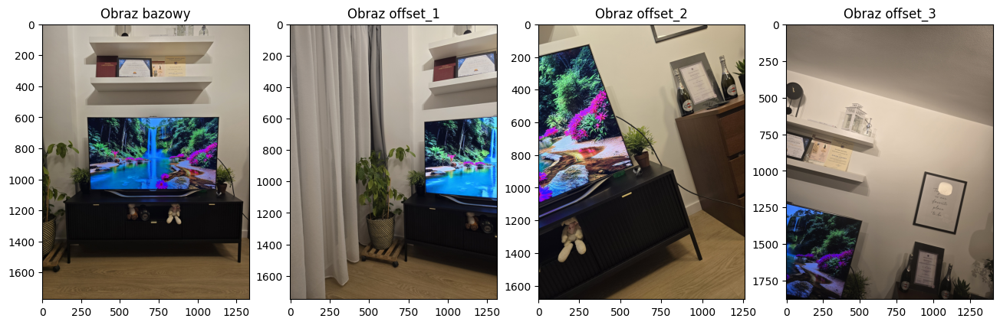

In [228]:
plt.figure(figsize=(16, 10))
plt.subplot(1, 4, 1)
plt.imshow(base[..., ::-1])
plt.title("Obraz bazowy")
plt.subplot(1, 4, 2)
plt.imshow(offset_1[..., ::-1])
plt.title("Obraz offset_1")
plt.subplot(1, 4, 3)
plt.imshow(offset_2[..., ::-1])
plt.title("Obraz offset_2")
plt.subplot(1, 4, 4)
plt.imshow(offset_3[..., ::-1])
plt.title("Obraz offset_3")
plt.show()


Min distance: 18.138357162475586, Max distance: 411.0279846191406


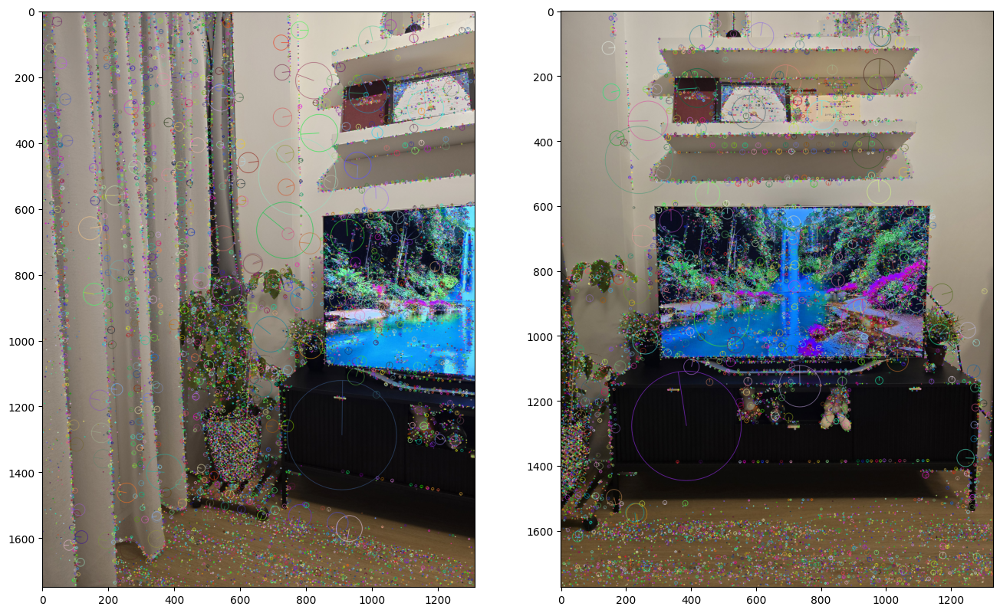

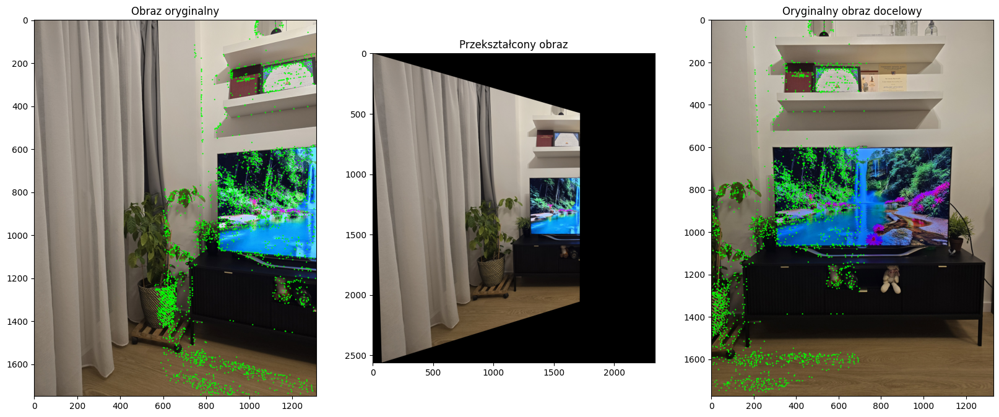

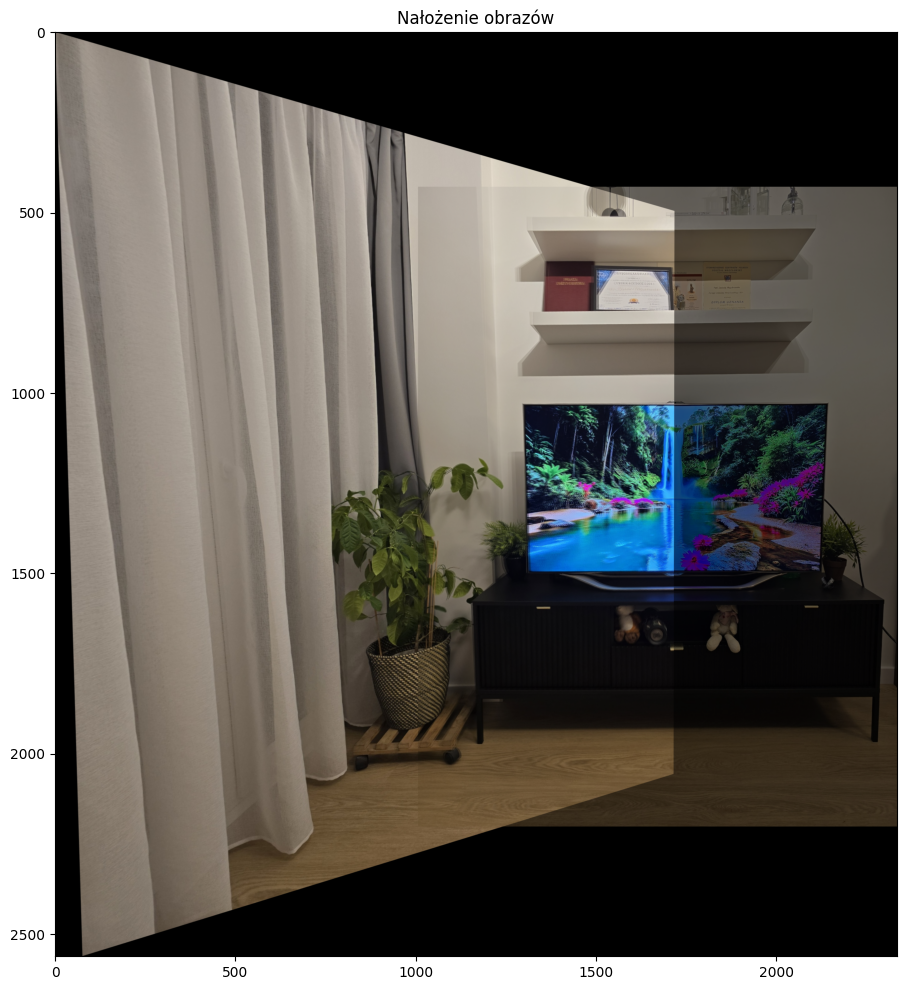

In [229]:
kp1, ds1, kp2, ds2 = find_kp(offset_1, base, 0.01, 300, display=True)
good_matches = show_matches(kp1, ds1, kp2, ds2, offset_1, base, 300, display=False)
H, transformed_image, canvas, matches_mask = find_homography_and_transform(kp1, kp2, good_matches, offset_1, base, reproj_thresh=50, display=True)

Min distance: 20.32240104675293, Max distance: 414.2789001464844


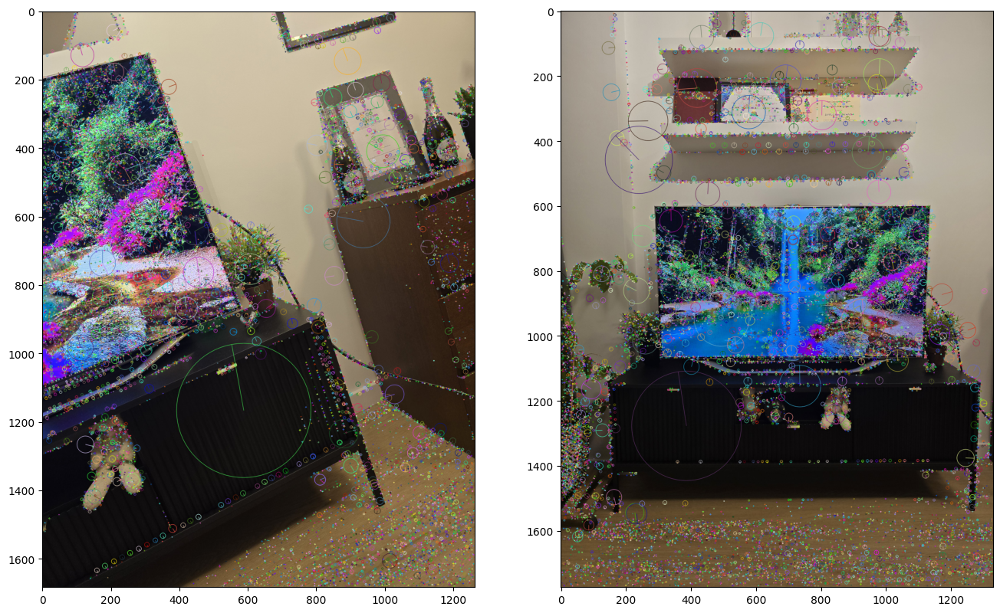

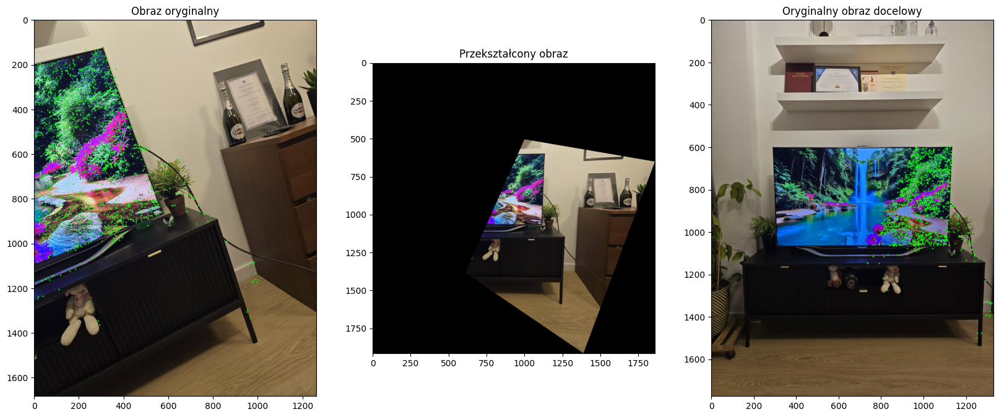

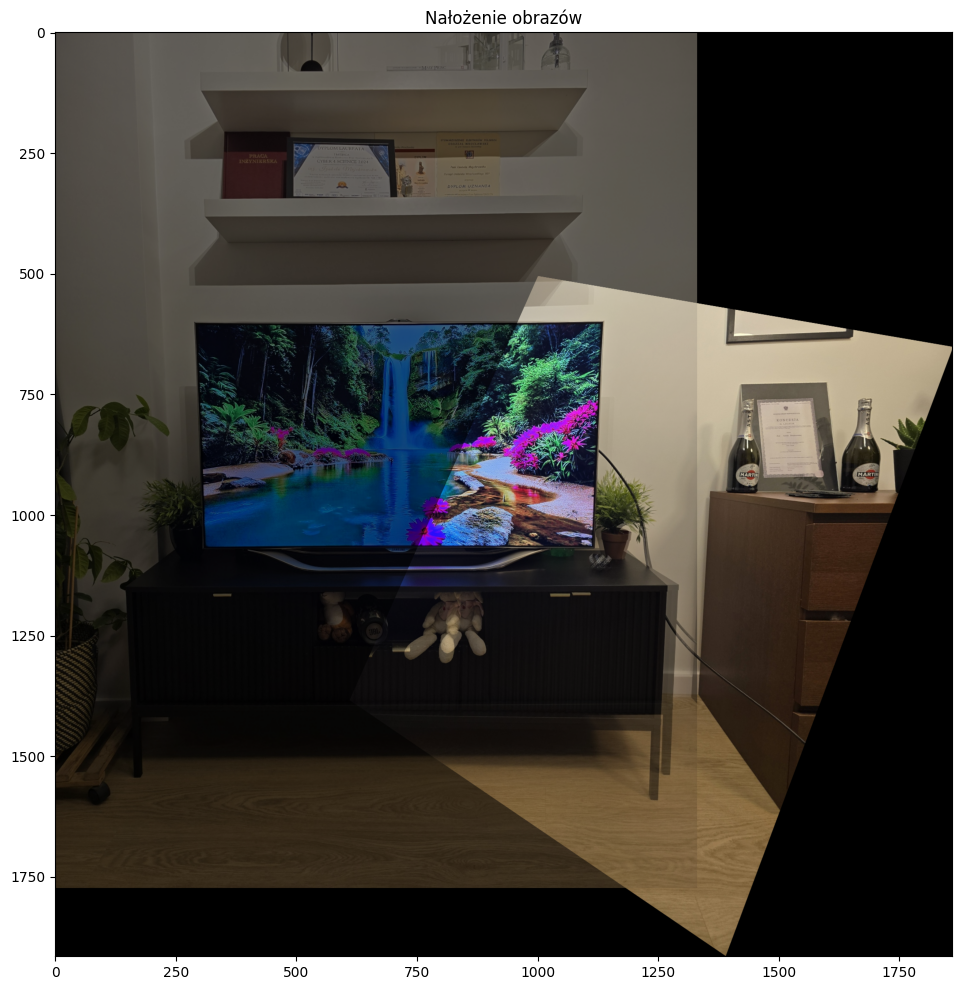

In [230]:
kp1, ds1, kp2, ds2 = find_kp(offset_2, base, 0.01, 300, display=True)
good_matches = show_matches(kp1, ds1, kp2, ds2, offset_2, base, 300, display=False)
H, transformed_image, canvas, matches_mask = find_homography_and_transform(kp1, kp2, good_matches, offset_2, base, reproj_thresh=20, display=True)

Min distance: 19.51922035217285, Max distance: 401.68145751953125


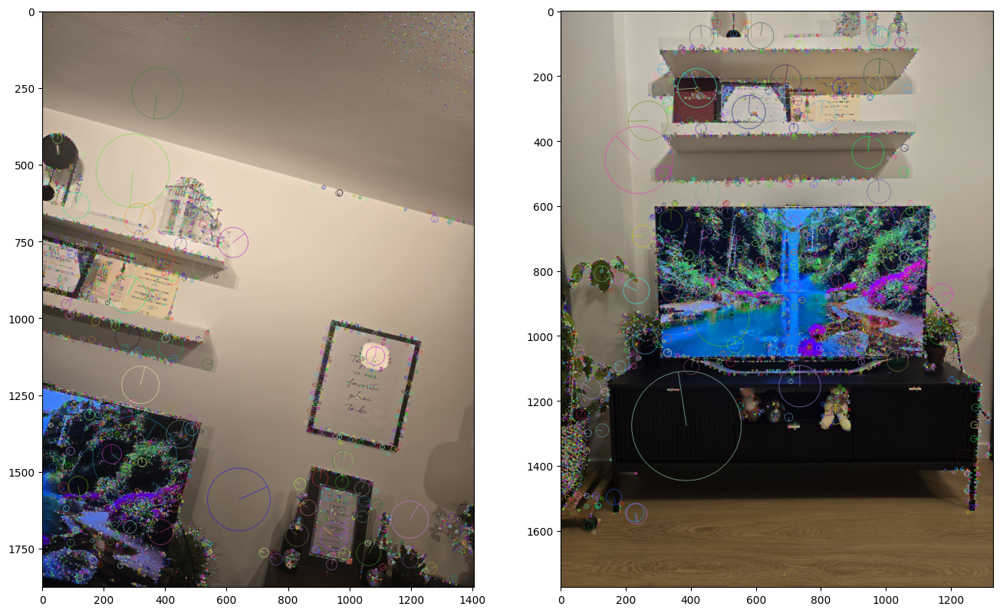

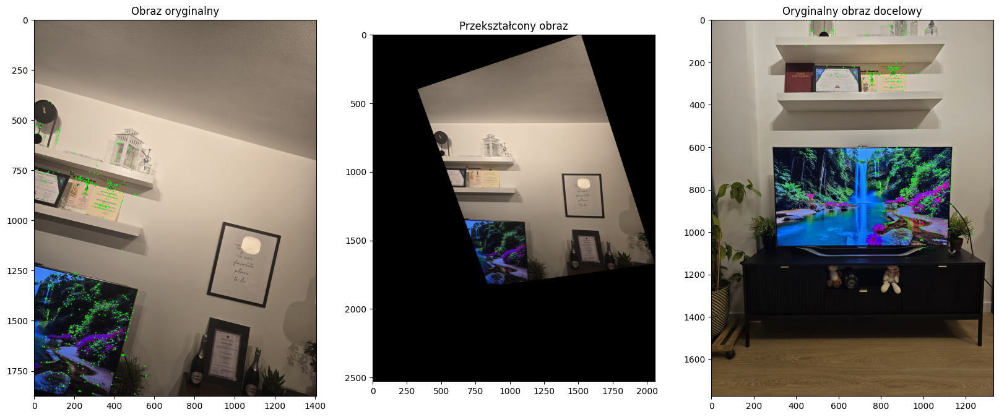

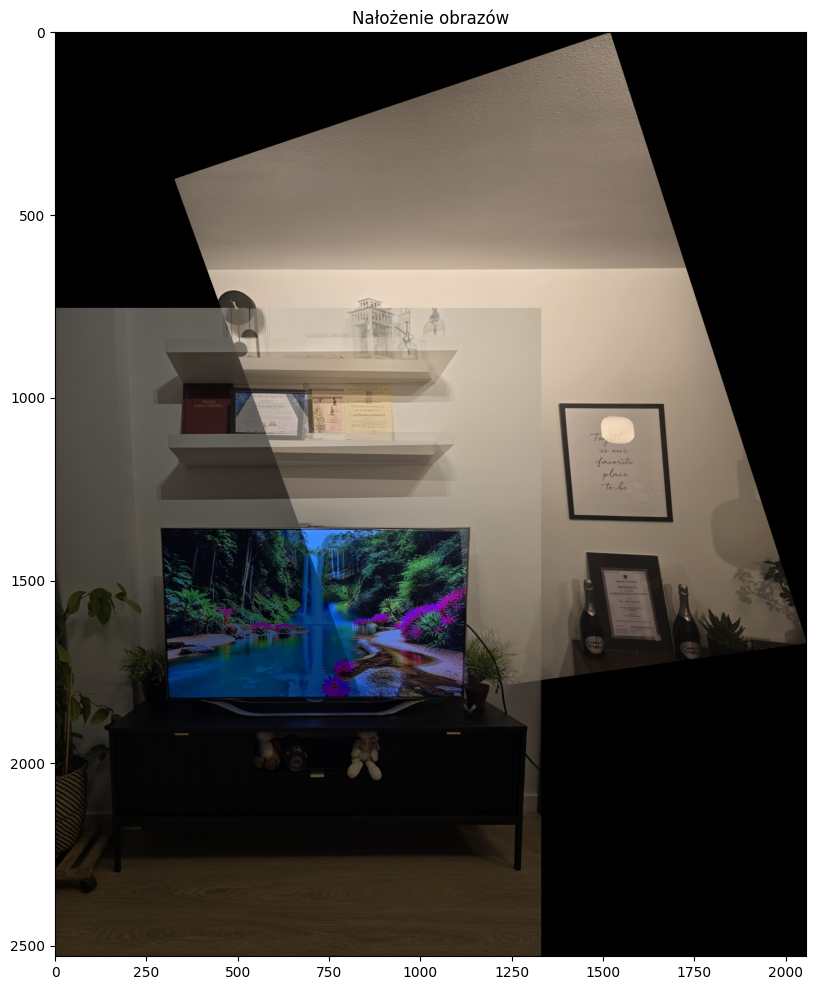

In [231]:
kp1, ds1, kp2, ds2 = find_kp(offset_3, base, 0.03, 200, display=True)
good_matches = show_matches(kp1, ds1, kp2, ds2, offset_3, base, 220, display=False)
H, transformed_image, canvas, matches_mask = find_homography_and_transform(kp1, kp2, good_matches, offset_3, base, reproj_thresh=120, display=True)

### łączenie trzech

Min distance: 18.138357162475586, Max distance: 411.0279846191406


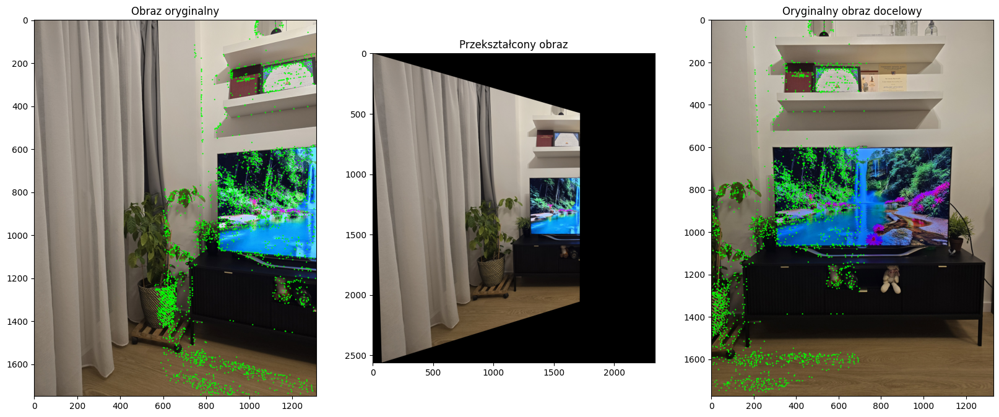

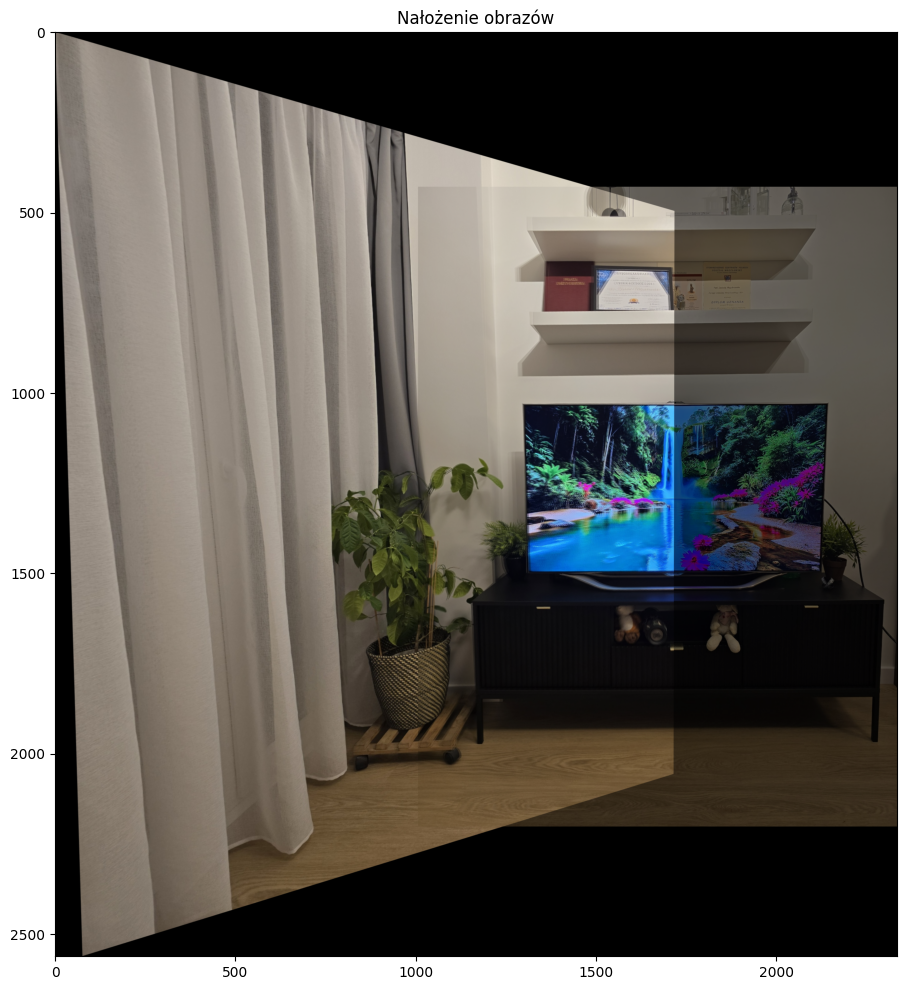

In [232]:
kp1, ds1, kp2, ds2 = find_kp(offset_1, base, 0.01, 300, display=False)
good_matches = show_matches(kp1, ds1, kp2, ds2, offset_1, base, 300, display=False)
H, transformed_image, canvas2, matches_mask = find_homography_and_transform(kp1, kp2, good_matches, offset_1, base, reproj_thresh=50, display=True)

Min distance: 21.97726058959961, Max distance: 403.9851379394531


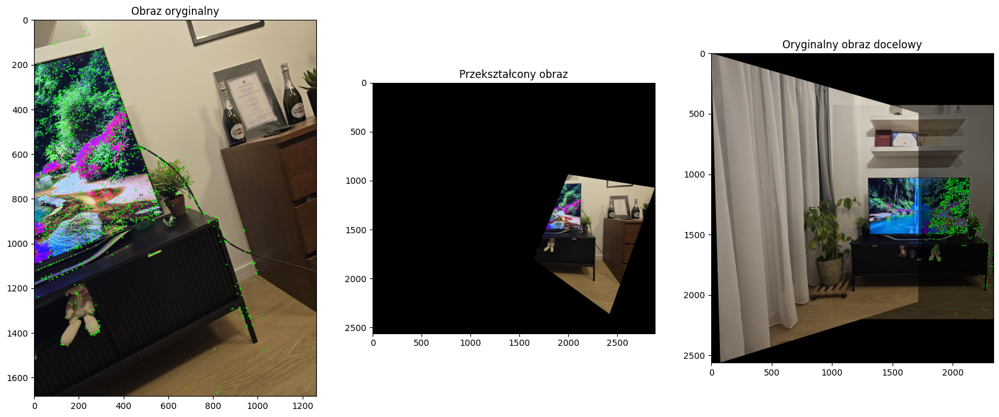

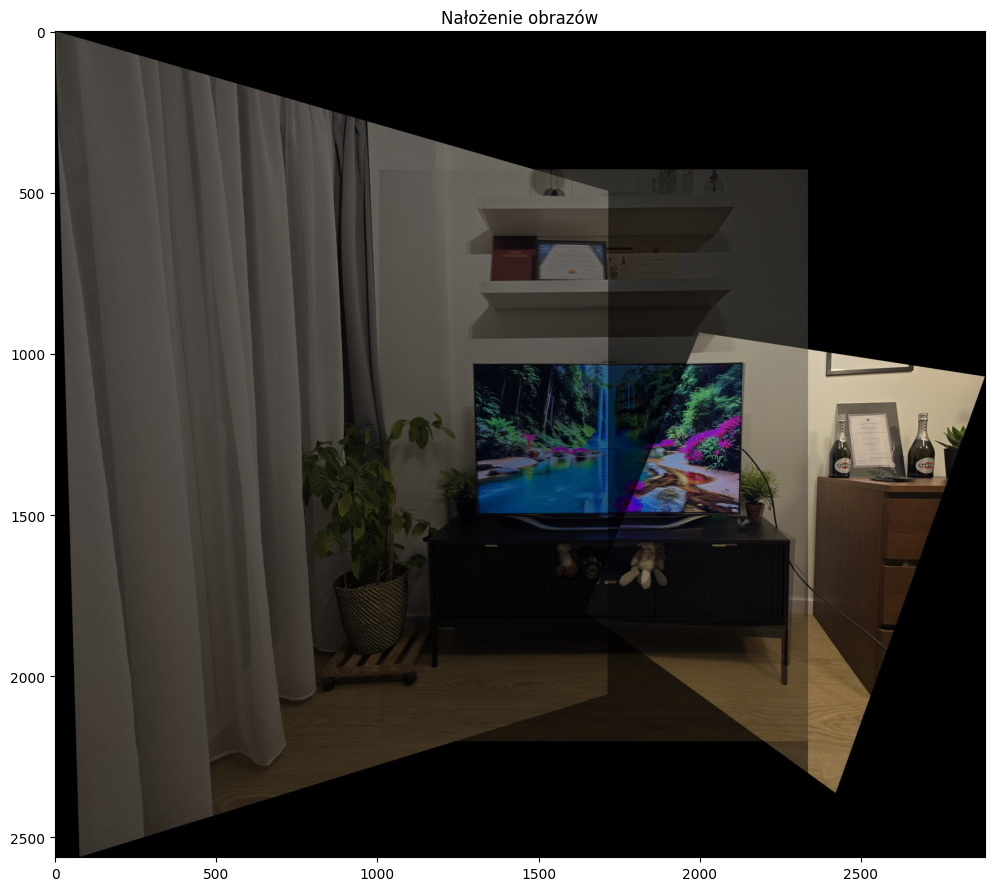

In [233]:
kp1, ds1, kp2, ds2 = find_kp(offset_2, canvas2, 0.01, 350, display=False)
good_matches = show_matches(kp1, ds1, kp2, ds2, offset_2, canvas2, 350, display=False)
H, transformed_image, canvas3, matches_mask = find_homography_and_transform(kp1, kp2, good_matches, offset_2, canvas2, reproj_thresh=80, display=True)

Min distance: 17.029386520385742, Max distance: 400.7206115722656


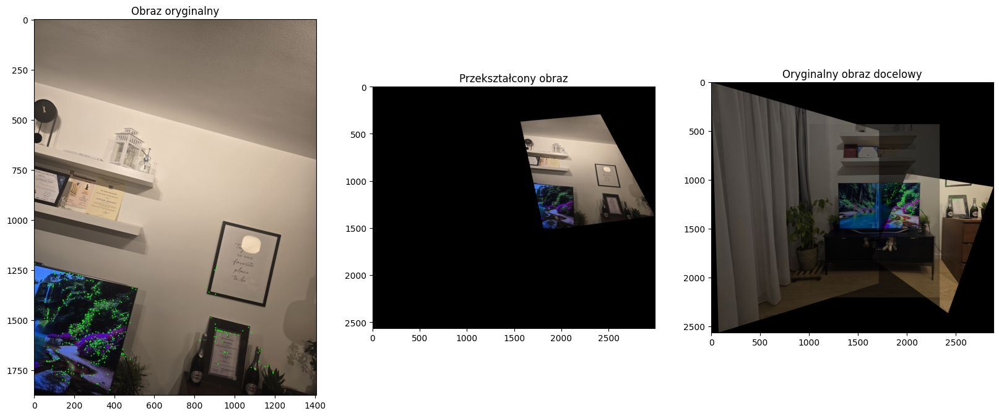

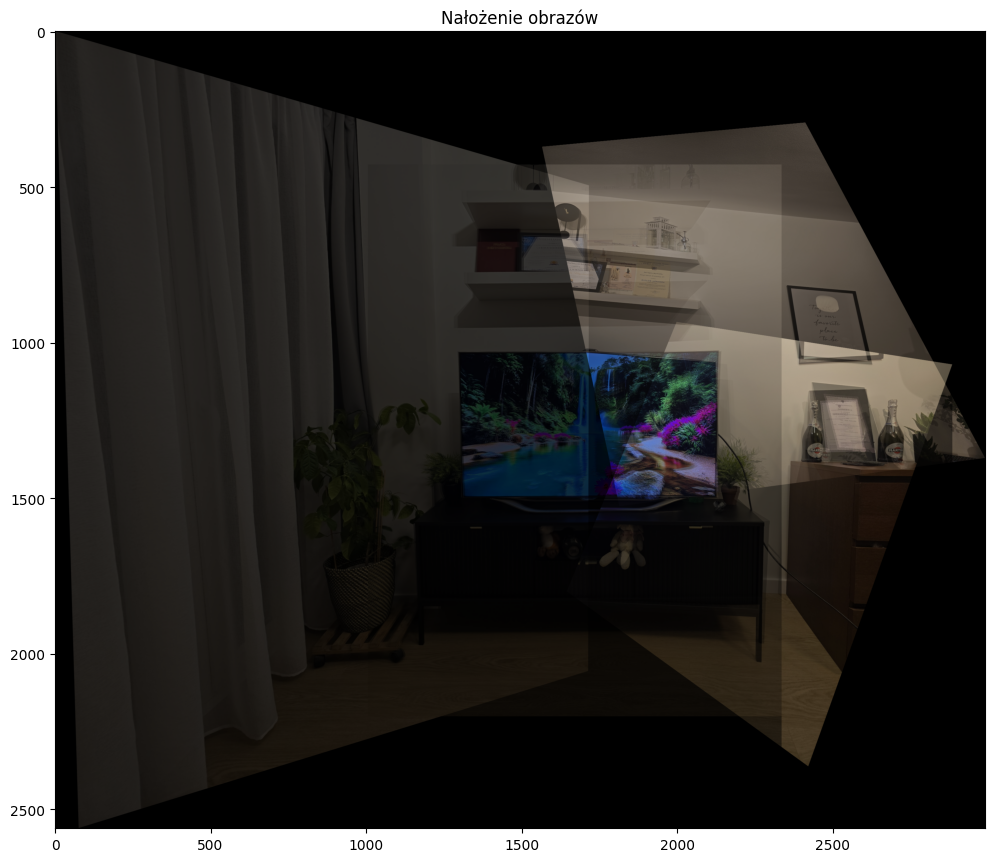

In [239]:
kp1, ds1, kp2, ds2 = find_kp(offset_3, canvas3, 0.03, 100, display=False)
good_matches = show_matches(kp1, ds1, kp2, ds2, offset_3, canvas3, 320, display=False)
H, transformed_image, final_canvas, matches_mask = find_homography_and_transform(kp1, kp2, good_matches, offset_3, canvas3, reproj_thresh=50, display=True)

Min distance: 17.029386520385742, Max distance: 400.7206115722656


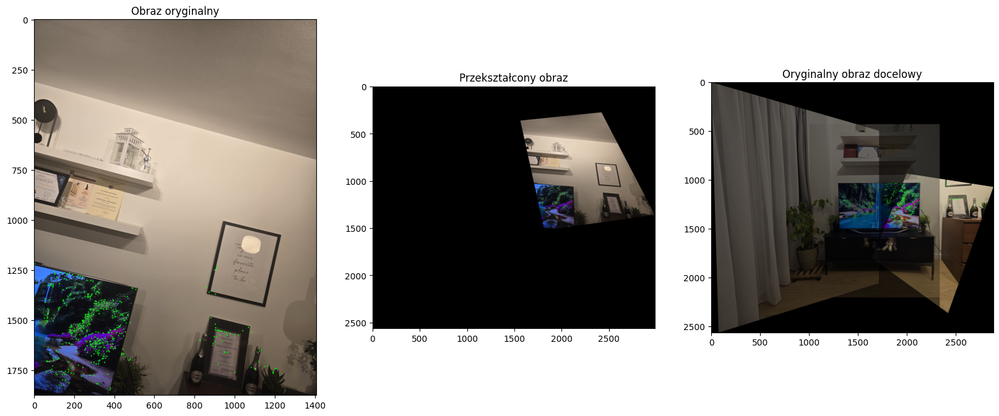

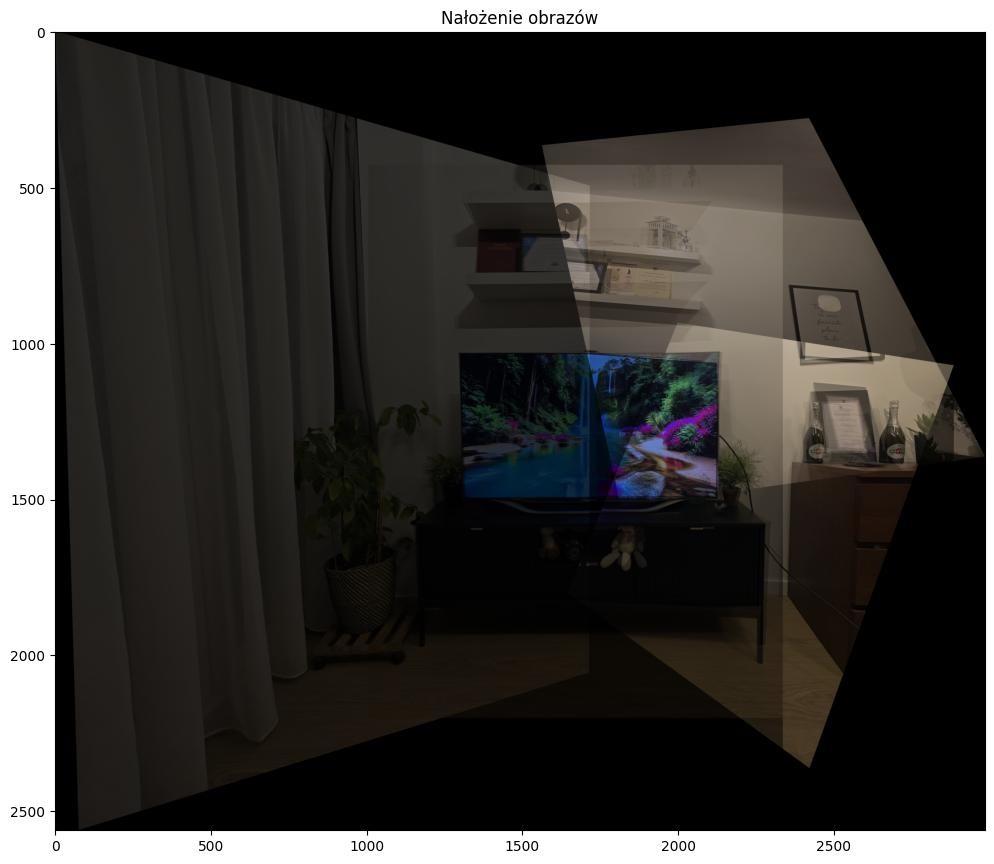

In [242]:
kp1, ds1, kp2, ds2 = find_kp(offset_3, canvas3, 0.03, 100, display=False)
good_matches = show_matches(kp1, ds1, kp2, ds2, offset_3, canvas3, 320, display=False)
H, transformed_image, final_canvas, matches_mask = find_homography_and_transform(kp1, kp2, good_matches, offset_3, canvas3, reproj_thresh=60, display=True)